# M77 Coursework: 3D "Pac-Man"
The following coursework is designed to test multiple components of the module sylabus; including 3D geometry, object detection, feature extraction and image manipulation.

Your task is to complete the below skeleton code to play a Pac-Man-esque game in 3D. You are allowed to utilise method discussed in the course, including feature extractors and deep learning approaches.

The aim of the coursework is to step through a 3D pointcloud of the old PhD lab at Swansea University. Several large spheres have been placed within the space, it is your job to move through the pointcloud in an automated fashion, detecting the location of the sphere and moving to the predicted 3D location. If you land close enough to a sphere it will be captured and removed from the pointcloud. 

You will need to decide what kinds of feature you want to use, extract these features and train a classifier to detect the spheres within an image. You can then use the functionality provided in the PacMan_functionality.py module to obtain the XYZ coordinates of the pixel you predict to be a sphere.


## Imports
Hre we will do our usual imports. I would recommend numpy, scipy, skimage, matplotlib and sklearn. If you wish to utilise the pointcloud processing toolkit you can do that as described in the handout. We will want to import our PacMan_functionality module as well.

In [1]:
import PacMan_functionality as PacMan
import numpy as np
from numpy import asarray
import matplotlib.pyplot as plt

import cv2
import pptk

# For plotting:
%matplotlib inline
#%matplotlib notebook
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# For operating-system tools and file-finding
import os
import glob
from os import listdir

# For resizing images
import skimage
import skimage.transform

import numpy as np
from sklearn.model_selection import train_test_split

# For deep learning functionality
import tensorflow as tf
from tensorflow.python.keras.models import Sequential, load_model
from tensorflow.python.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.python.keras.layers import Conv2D, MaxPool2D
from tensorflow.python.keras.layers import SimpleRNN, LSTM

## Game setup.
This cell will initialise the game world and add all of our spheres to the world. Do not edit the code here.

In [2]:
# Call startup_scene() to load the initial game scene
global_cloud, spheres_collected = PacMan.startup_scene()

In [3]:
# View our pointcloud if we want
# Unneeded while initially setting up, uncemment when time comes!!!!!!      ->     v = pptk.viewer(global_cloud['Positions'], global_cloud['Colors']/255) # Fast, requires pptk
# Unneeded while initially setting up, uncemment when time comes!!!!!!      ->     PacMan.show_point_cloud(global_cloud) # Slow, requires matplotlib

## Load the training data: Positives and Negatives
In the handout zip file there is a directory which contains numerous patches extracted from sample images. These patches are labelled as either containing a sphere or not. You may wish to use these to train a classifier for sphere detection.

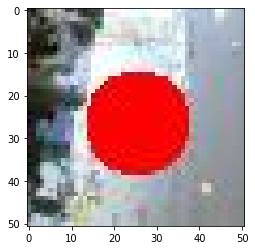

(51, 51, 3)


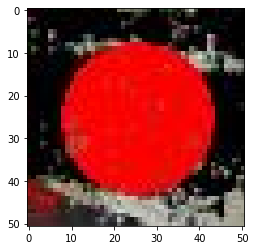

(51, 51, 3)


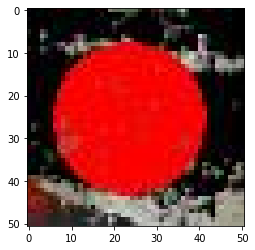

(51, 51, 3)


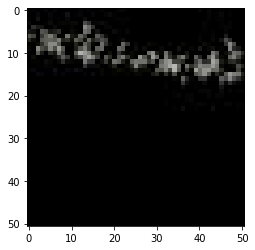

(51, 51, 3)


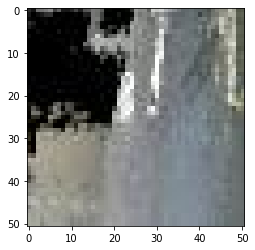

(51, 51, 3)


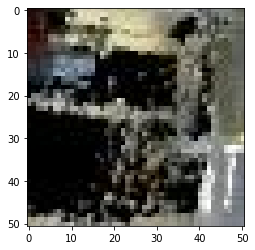

(51, 51, 3)
(2908, 51, 51, 3)
(2908,)


In [3]:
# Get the training samples for both positive and negative patches

# Concatenate the patches into a 4D numpy array (S*H*W*C.jpgnd create a label vector (S).jpg.jpg
pos_loaded_images = list()
neg_loaded_images = list()
all_images = list()
labels = list()

count = 0
for filename in listdir('TrainingImages/positives'):
    img_data = cv2.imread('TrainingImages/positives/' + filename)
    if count < 3:
        plt.imshow(cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB))
        plt.show()  # display!
        print(img_data.shape)
        count += 1

    all_images.append(img_data)
    labels.append(int(1))
    #print('> loaded %s %s' % (filename, img_data.shape))

count = 0
for filename in listdir('TrainingImages/negatives'):
    img_data = cv2.imread('TrainingImages/negatives/' + filename)
    if count < 3:
        plt.imshow(cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB))
        plt.show()  # display!
        print(img_data.shape)
        count += 1

    all_images.append(img_data)
    labels.append(int(0))
    #print('> loaded %s %s' % (filename, img_data.shape))

all_data = asarray(all_images)
labels = asarray(labels)
print(all_data.shape)
print(labels.shape)

In [5]:
# https://machinelearningmastery.com/how-to-load-and-manipulate-images-for-deep-learning-in-python-with-pil-pillow/
# https://www.pyimagesearch.com/2014/11/03/display-matplotlib-rgb-image/

## Train a classifier on the samples, this may require feature extraction on the patches
Depending on your desired apporach you may want to extract features on the training patches you have been given. These can then be used to train our desired classifier to detect the patches based not on the raw data, but on a representative feature descriptor. Several are talked about both in the lectures and labs. 

In [6]:
# Extract the features - maybe, might not be needed with representation learning approaches

In [7]:
# Train a classification model to perform binary classification of the patch into whether it contains a sphere.

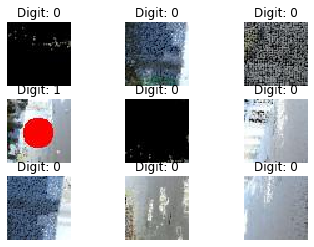

In [4]:
# Split Dataset
X = all_data
y = labels

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.33) # Was removed from the end , random_state=42

# Get the one-hot encoded labels
n_class = len(np.unique(y_train))
Y_train = np.eye(n_class)[y_train]
Y_test = np.eye(n_class)[y_test]

plt.figure()
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))#plt.imshow(X_train[i], cmap='gray', interpolation='none')
    plt.title("Digit: {}".format(y_train[i]))
    plt.axis('off')

In [46]:
#CNN
X_train = X_train.astype('float32')

# Create the model using Sequential object
model = Sequential()

# Create the first hidden layer, this takes an argument of the input data shape (i.e. number of features)
model.add(Conv2D(10, (3, 3), input_shape=(X_train.shape[1:])))  #og: model.add(Conv2D(10, (3, 3), input_shape=(X_train.shape[1], X_train.shape[2], 3))) alt:model.add(Conv2D(10, (3, 3),  input_shape=(X_train.shape[1:]))) doen't work: input_shape=(160,240, 3)))
model.add(Activation('relu'))                         
model.add(Dropout(0.2))

# Create the next hidden layer, this takes an argument of the input data shape (i.e. number of features)
model.add(MaxPool2D())
model.add(Activation('relu'))                         
model.add(Dropout(0.2))

# Create the dense head layer
model.add(Flatten())
model.add(Dense(50))
model.add(Activation('relu'))

# Create the output layer
model.add(Dense(2))
model.add(Activation('softmax'))

# Compile the model ready for training
model.compile('adam', loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, Y_train, epochs=10, validation_split=0.3)

Train on 1363 samples, validate on 585 samples
Epoch 1/10
1363/1363 [==============================] - 1s 992us/sample - loss: 2.4990 - accuracy: 0.9721 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 2/10
1363/1363 [==============================] - 1s 465us/sample - loss: 6.3951e-04 - accuracy: 1.0000 - val_loss: 9.6277e-04 - val_accuracy: 1.0000
Epoch 3/10
1363/1363 [==============================] - 1s 454us/sample - loss: 2.0816e-04 - accuracy: 1.0000 - val_loss: 1.5688e-04 - val_accuracy: 1.0000
Epoch 4/10
1363/1363 [==============================] - 1s 456us/sample - loss: 3.5510e-05 - accuracy: 1.0000 - val_loss: 9.2494e-05 - val_accuracy: 1.0000
Epoch 5/10
1363/1363 [==============================] - 1s 452us/sample - loss: 1.8705e-05 - accuracy: 1.0000 - val_loss: 7.3099e-05 - val_accuracy: 1.0000
Epoch 6/10
1363/1363 [==============================] - 1s 460us/sample - loss: 2.0499e-05 - accuracy: 1.0000 - val_loss: 4.4206e-05 - val_accuracy: 1.0000
Epoch 7/10
1363/1363 [===

In [47]:
X_test = X_test.astype('float32')

predicted_probability = model.predict(X_test)
predicted_class = predicted_classes = model.predict_classes(X_test)

correct_preds = np.nonzero(predicted_classes == y_test)[0]
incorrect_preds = np.nonzero(predicted_classes != y_test)[0]

print("{0} classified correctly".format(len(correct_preds)))
print("{0} classified incorrectly".format(len(incorrect_preds)))
print("{0:.2f}% of test set classified correctly".format(len(correct_preds) / len(y_test) * 100))

960 classified correctly
0 classified incorrectly
100.00% of test set classified correctly


In [ ]:
# Summarize history for accuracy
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
plt.figure()

In [ ]:
# Summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Initialise our starting point in the game and get our first view into the scene
We should start the game at a position of XYZ = [0, 0, 0] and a camera angle of [0, 0, 0]. These variables can be updated once we find a sphere, or rotated when we don't find a sphere. We can then get our first image projected to the camera plane to start our game. 

In [7]:
# Initialise position and angle variable 

position = np.zeros([3])
angle = np.zeros([3])

# position[0] = X [- goes left, + goes right], position[1] = y, position[2] = depth(z)

In [8]:
# Main interaction


In [7]:
def sliding_window():
   stepSize = 2
   predict_array = list()
   #np array add prdicted values to it.
   window_patches = []
   center_x = list()
   center_y = list()

   (w_width, w_height) = (51, 51) # window size

   for x in range(0, image.shape[0] - w_width , stepSize):
      for y in range(0, image.shape[1] - w_height, stepSize):
         window = image[x:x + w_width, y:y + w_height, :]
         center_x.append(x + 25)
         center_y.append(y + 25)
         window_exp = np.expand_dims(window,0)
         window_patches.append(window)

   return asarray(window_patches), asarray(center_x), asarray(center_y)

In [8]:
def highest_prob(patch_proba):
    pointer_position = 0
    highest_score = 0

    for i in range(len(patch_proba)):
        if highest_score < patch_proba[i,0]:
            highest_score = patch_proba[i,0]
            pointer_position = i
    
    print(pointer_position) # Remove in final version
    print("highest %:",highest_score) # Remove in final version
    
    return pointer_position, highest_score

## Perform our loop, in which we will perform pixel-wise prediction on binary class label and then perform the correct action based on detection of spheres.
This will be the main bulk of your implementation, utilising the feature descriptors and trained models from the above cells. In each loop of the program we will want to:
-  Get current view into the scene
-  Extract patches from the scene
-  Extract features on the patches
-  Use the pretrained model to obtain class prediction probabilities
-  Identify if a sphere has been found in the scene
  -  If so, find the mapped XYZ location, move there and update the scene
  -  If not, rotate the camera in a bid to find the sphere


2981
highest %: 0.9967636
I am now at position [-0.1871552972645423, 0.05876877020806853, 2.309382003932991]
Angle = [0. 0. 0.]
I have found 1 out of 11 spheres!

position:  [-0.1871553   0.05876877  2.309382  ]
previous postition: [-0.1871553   0.05876877  2.309382  ]
2504
highest %: 0.9958703
I am now at position [-0.39449034782446823, 0.022561957444136478, 4.727839842694403]
Angle = [0. 0. 0.]
I have found 2 out of 11 spheres!

position:  [-0.39449035  0.02256196  4.72783984]
previous postition: [-0.39449035  0.02256196  4.72783984]
3817
highest %: 0.99567574
I am now at position [-0.8750658980644709, 0.20468620937838097, 7.0356543255966155]
Angle = [0. 0. 0.]
I have found 3 out of 11 spheres!

position:  [-0.8750659   0.20468621  7.03565433]
previous postition: [-0.8750659   0.20468621  7.03565433]
4981
highest %: 0.9905246
I am now at position [-0.9884751646764185, 0.601921681441482, 9.399904998624924]
Angle = [0. 0. 0.]
I have found 4 out of 11 spheres!

position:  [-0.98847516  

/Users/Andy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/Andy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


position:  [-6.01055956  0.58036077 11.27786922]
previous postition: [-3.7369622  1.0877    12.9408446]
92
highest %: 0.99692196
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0.  -2.5  0. ]
I can not find any red balls!
I am scanning the room....
position:  [0. 0. 0.]
previous postition: [-3.7369622  1.0877    12.9408446]
77
highest %: 0.9963714
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -3.  0.]
I can not find any red balls!
I am scanning the room....
position:  [0. 0. 0.]
previous postition: [-3.7369622  1.0877    12.9408446]
I'm lost!


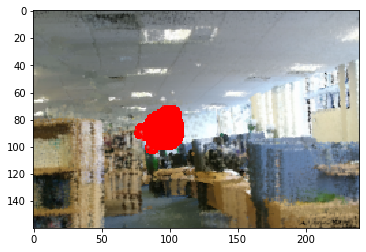

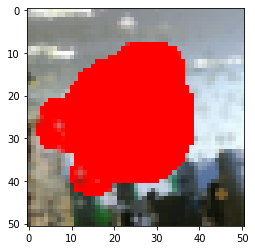

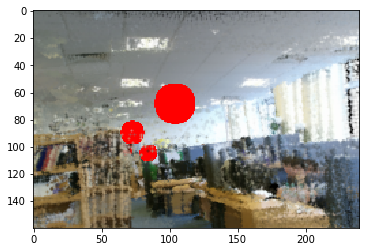

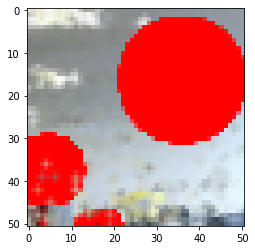

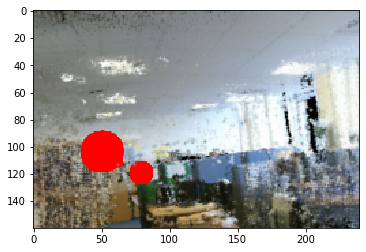

...

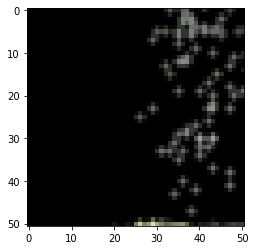

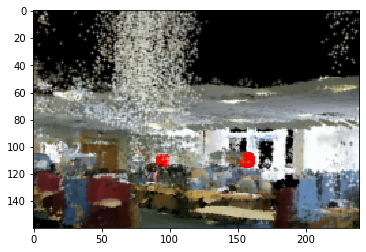

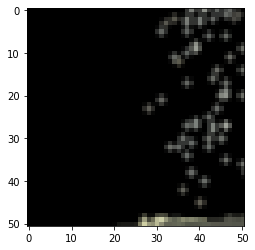

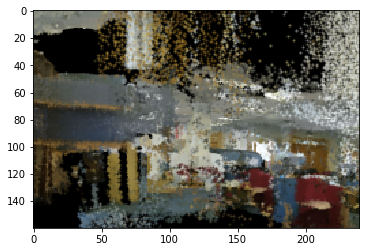

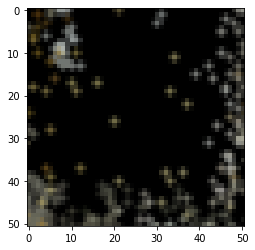

In [41]:
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])
previous_position = np.zeros([3])
failed = False
lost = 0

# Get current image from viewpoint
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

while not np.all(spheres_collected): # While there are spheres to find
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    PacMan.show_point_cloud(global_cloud)
    # Extract patches from the scene
    
    # Extracting Window Patches, X and Y center points
    patches, x_center, y_center = sliding_window()

    # Extract features from the patches
    
    # Predict the probability of a pixel being a sphere, based on the patch
    # Predicting probabilities on window patches
    patch_probabilities = model.predict_proba(patches)

    # Use probabilities to find sphere coordinates in 3D
    # Get highest probability window location
    image_position, highest_percent = highest_prob(patch_probabilities)

    # Plot image to check
    plt.figure()
    plt.imshow(image)
    plt.figure()
    plt.imshow(patches[image_position])
    

    # Update camera appropriately
    # New position
    #if failed == False:
    #position = [map1[x_center[image_position],y_center[image_position]],map2[x_center[image_position],y_center[image_position]],map3[x_center[image_position],y_center[image_position]]]

    position[0] = map1[x_center[image_position],y_center[image_position]]
    position[1] = map2[x_center[image_position],y_center[image_position]]
    position[2] = map3[x_center[image_position],y_center[image_position]]
        
    print('I am now at position [{0}, {1}, {2}]'.format(*position))
    print("Angle =", angle)
    
    try:
        global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
        print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
        lost = 0
        angle[1] = 0
        previous_position[0] = position[0]
        previous_position[1] = position[1]
        previous_position[2] = position[2]
        failed = False
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    except:
        print("I can not find any red balls!")
        print("I am scanning the room....")
        if failed != True:
            position[0] = previous_position[0]
            position[1] = previous_position[1]
            position[2] = previous_position[2]
        failed = True
        global_cloud, spheres_collected = PacMan.update_scene(previous_position, spheres_collected);
        
    if failed == True:
        #failed = False
        lost += 1
        angle[1] -= 0.5
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, previous_position)
    print("position: ", position)
    print("previous postition:", previous_position)#position = preveous_position
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, preveous_position)

    if lost == 5:
        print("I'm lost!")
        break
        

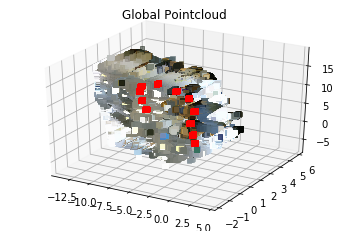

2885
highest %: 0.9999999
I am now at position [-0.1871206860642045, 0.0499370816520744, 2.309997371364827]
Angle = [0. 0. 0.]
I have found 1 out of 11 spheres!



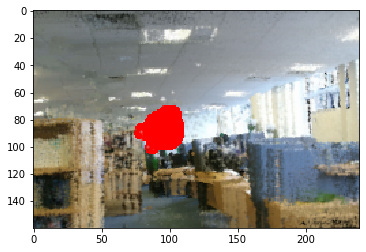

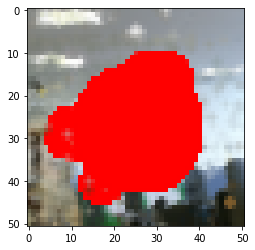

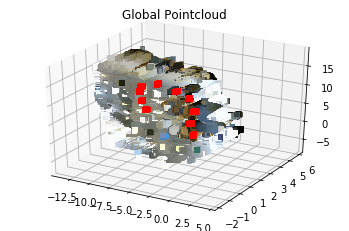

2223
highest %: 0.9999995
I am now at position [-0.32499977307039857, -0.030760641144832047, 4.673631407362985]
Angle = [0. 0. 0.]
I have found 2 out of 11 spheres!



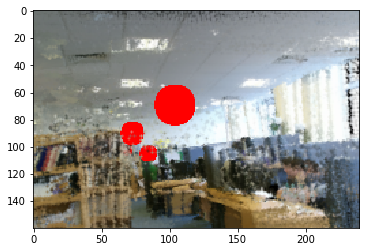

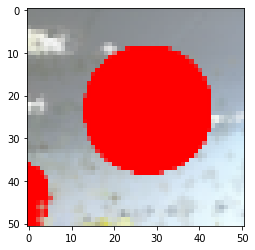

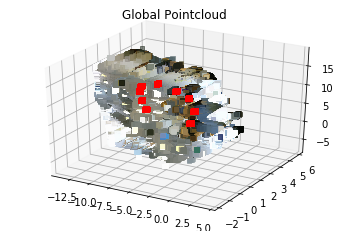

3999
highest %: 0.99999964
I am now at position [-0.9211396714313979, 0.19850687239066173, 7.011826953504689]
Angle = [0. 0. 0.]
I have found 3 out of 11 spheres!



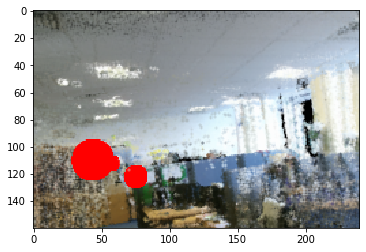

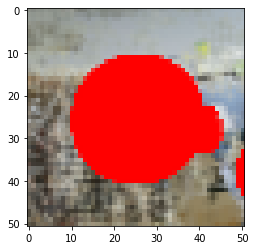

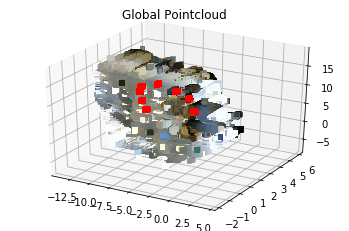

5170
highest %: 0.9999995
I am now at position [-1.0389913644214048, 0.6202065451988316, 9.378556972141258]
Angle = [0. 0. 0.]
I have found 4 out of 11 spheres!



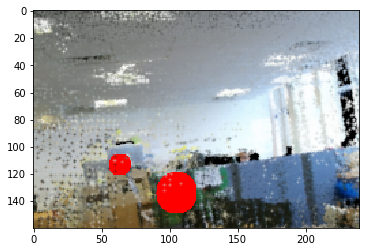

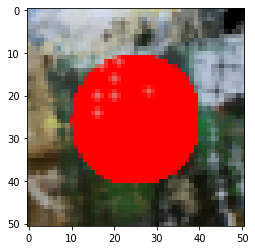

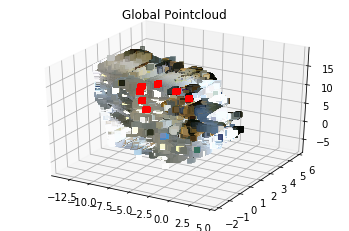

3421
highest %: 0.9999951
I am now at position [-1.892631140611772, 0.7702846017011646, 12.177158897733591]
Angle = [0. 0. 0.]
I have found 5 out of 11 spheres!



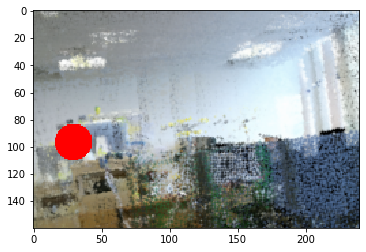

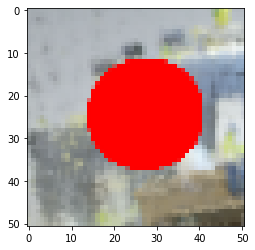

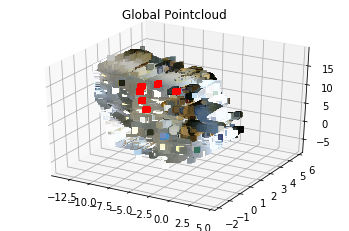

5201
highest %: 0.7777892
I am now at position [-1.302061676979065, 1.4700005054473877, 16.0594539642334]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


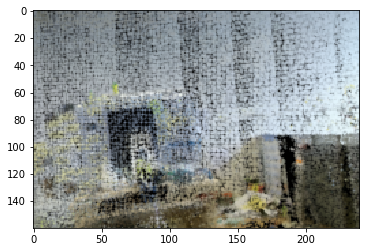

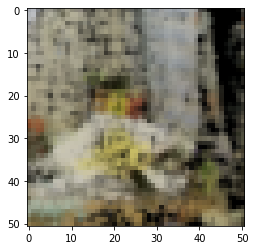

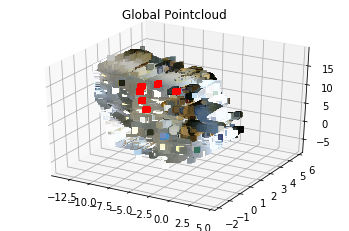

4865
highest %: 1.0
I am now at position [-3.736373642323989, 1.0726017881913084, 12.943849036840845]
Angle = [ 0. -1.  0.]
I have found 6 out of 11 spheres!



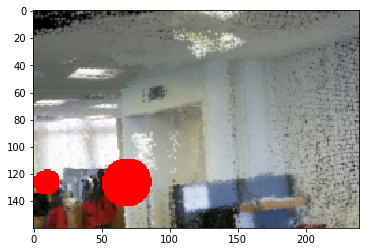

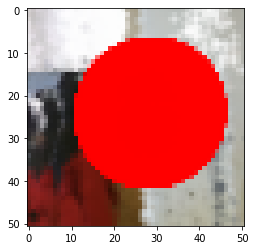

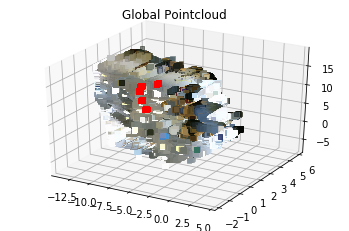

2184
highest %: 0.894265
I am now at position [-2.76617169380188, 0.9626814126968384, 16.102008819580078]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


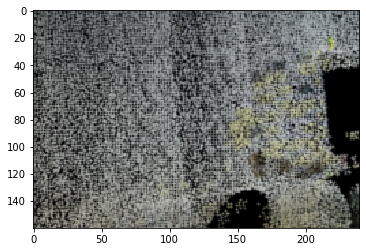

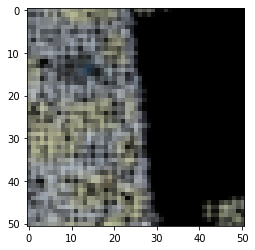

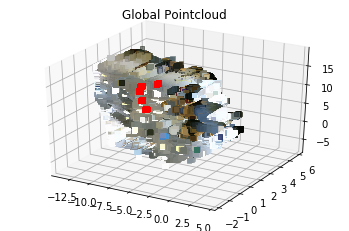

5144
highest %: 0.86301196
I am now at position [-10.028779983520508, 2.2503154277801514, 15.227806091308594]
Angle = [ 0. -1.  0.]
I can not find any red balls!
I am scanning the room....


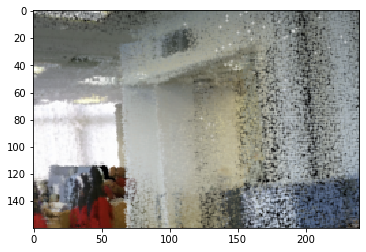

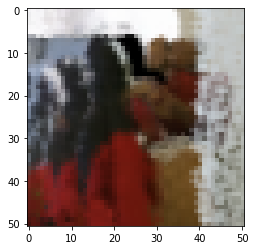

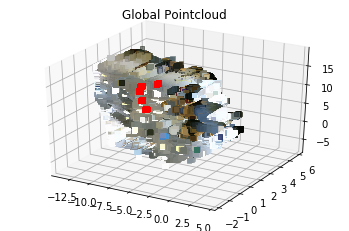

4249
highest %: 0.9982351
I am now at position [-8.879134268826187, 1.654483895157508, 11.453574085159522]
Angle = [ 0. -2.  0.]
I have found 7 out of 11 spheres!



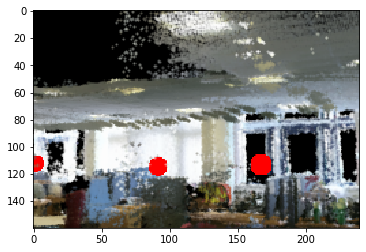

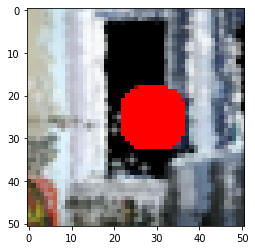

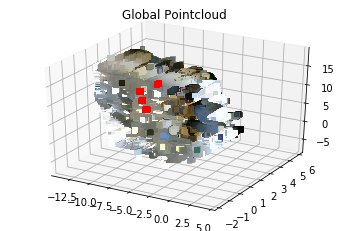

1189
highest %: 0.9934701
I am now at position [-8.842229843139648, 1.2018144130706787, 15.731443405151367]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


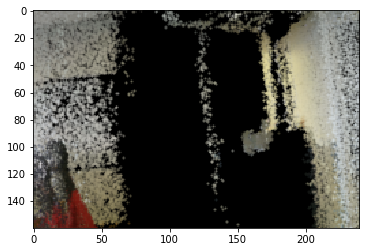

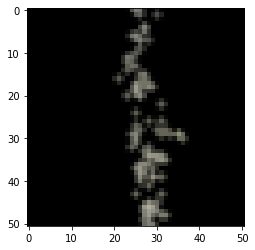

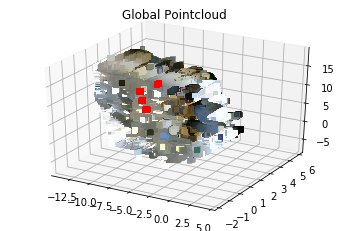

3135
highest %: 0.8234087
I am now at position [-12.817888259887695, 1.8118187189102173, 12.535285949707031]
Angle = [ 0. -1.  0.]
I can not find any red balls!
I am scanning the room....


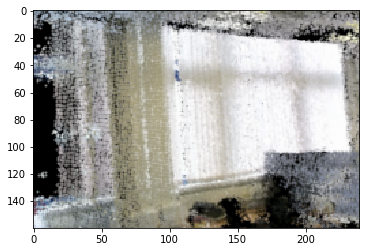

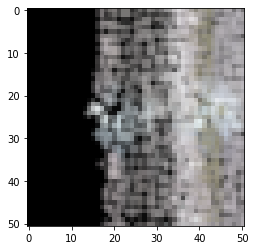

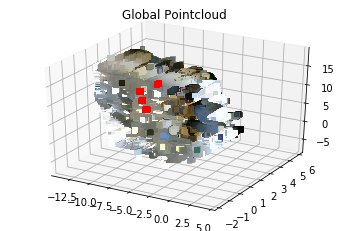

4727
highest %: 0.9838585
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -2.  0.]
I can not find any red balls!
I am scanning the room....


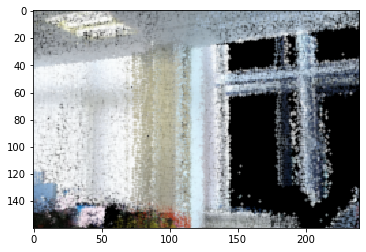

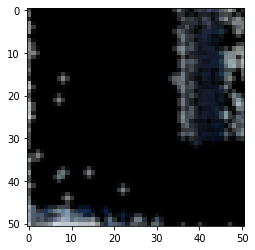

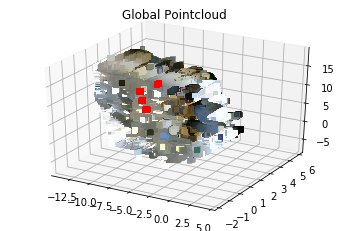

3773
highest %: 1.0
I am now at position [-9.366132218554903, 1.795300000409798, 9.769753281390143]
Angle = [ 0. -3.  0.]
I have found 8 out of 11 spheres!



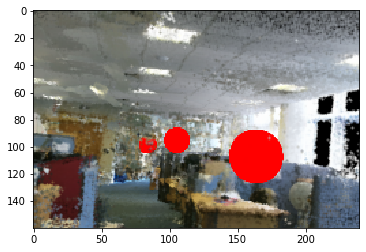

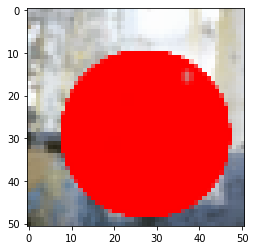

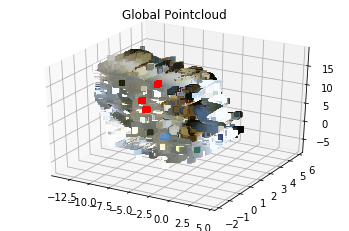

4722
highest %: 0.9936575
I am now at position [0.0, 0.0, 0.0]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


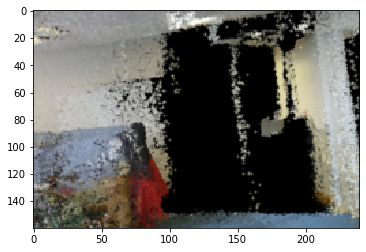

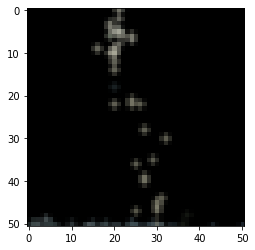

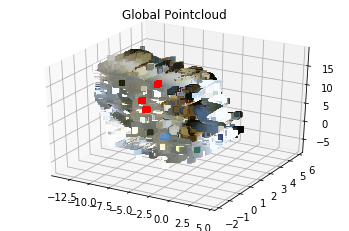

3345
highest %: 0.99177
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -1.  0.]
I can not find any red balls!
I am scanning the room....


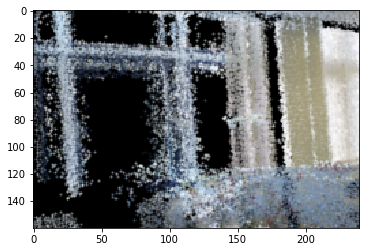

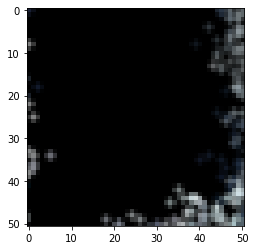

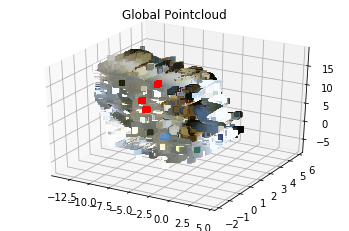

1603
highest %: 0.7781907
I am now at position [-12.402093887329102, 1.5611169338226318, 9.164887428283691]
Angle = [ 0. -2.  0.]
I can not find any red balls!
I am scanning the room....


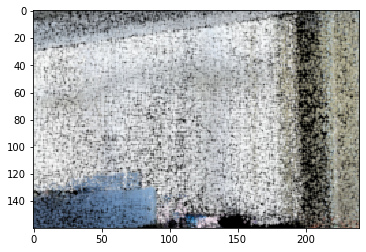

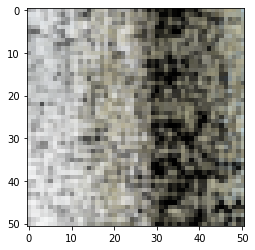

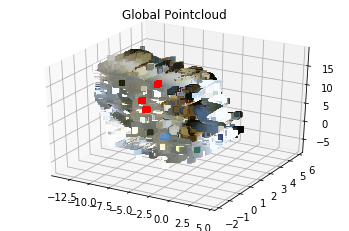

3060
highest %: 0.9999994
I am now at position [-9.278717950898889, 1.8681919658136457, 7.266256284485081]
Angle = [ 0. -3.  0.]
I have found 9 out of 11 spheres!



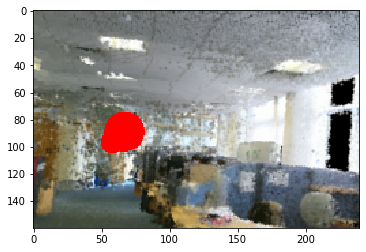

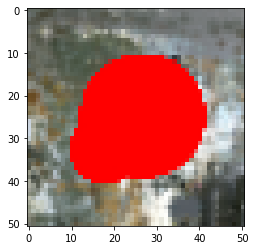

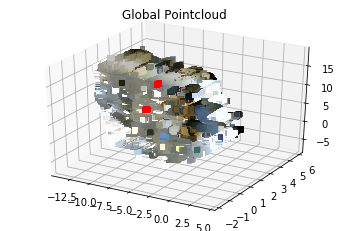

3189
highest %: 0.9905501
I am now at position [0.0, 0.0, 0.0]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


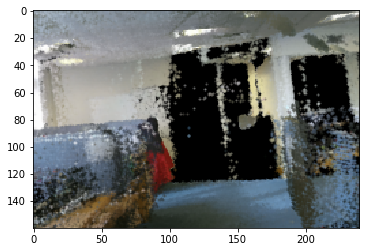

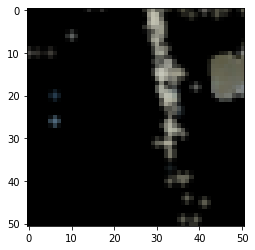

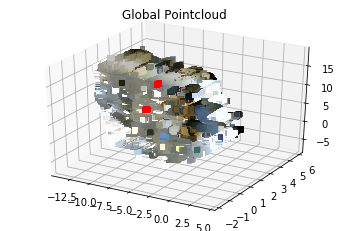

4070
highest %: 0.9263665
I am now at position [-12.803707122802734, 2.3447723388671875, 10.795379638671875]
Angle = [ 0. -1.  0.]
I can not find any red balls!
I am scanning the room....


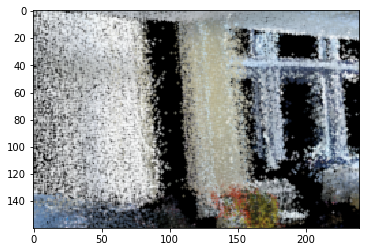

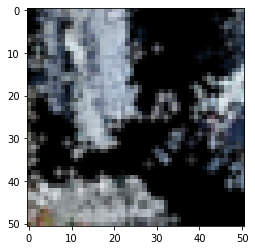

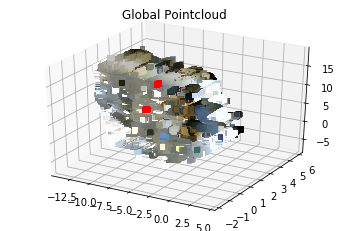

3901
highest %: 0.9841764
I am now at position [-12.781282424926758, 2.259345531463623, 4.335346221923828]
Angle = [ 0. -2.  0.]
I can not find any red balls!
I am scanning the room....


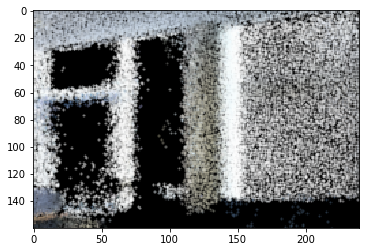

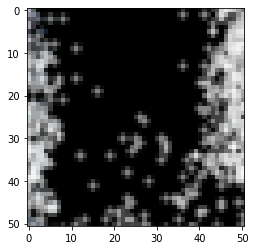

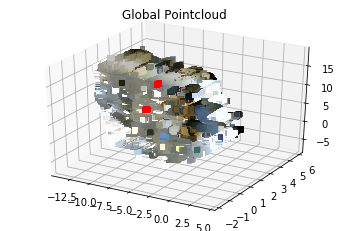

3717
highest %: 0.99999654
I am now at position [-9.040145880163074, 2.0744368220047082, 4.556540106161687]
Angle = [ 0. -3.  0.]
I have found 10 out of 11 spheres!



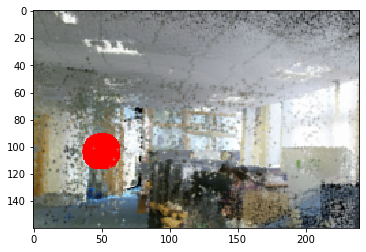

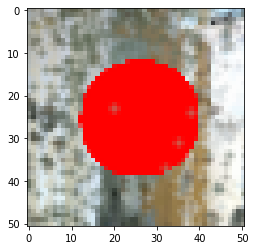

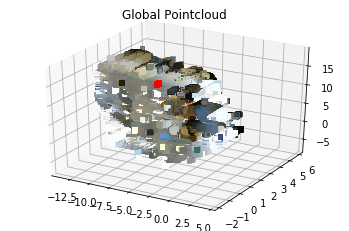

1795
highest %: 0.9908215
I am now at position [-6.358187675476074, 1.407039999961853, 15.122970581054688]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


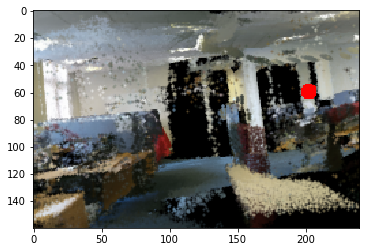

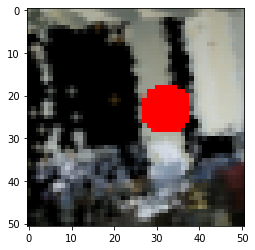

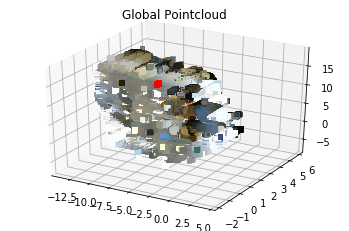

5035
highest %: 0.9904721
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -1.  0.]
I can not find any red balls!
I am scanning the room....


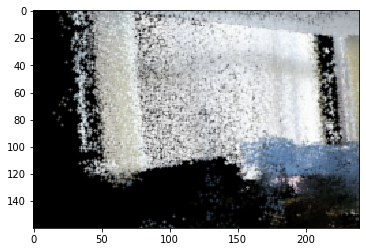

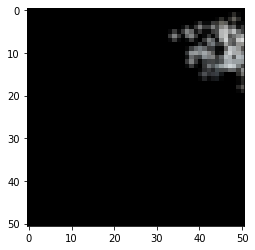

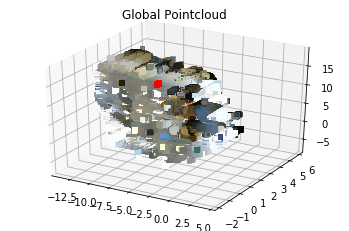

4332
highest %: 0.99517524
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -2.  0.]
I can not find any red balls!
I am scanning the room....


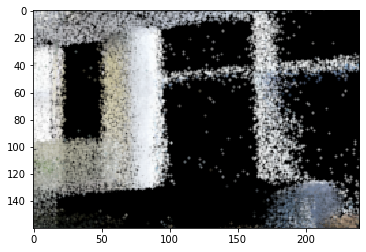

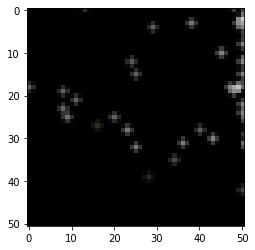

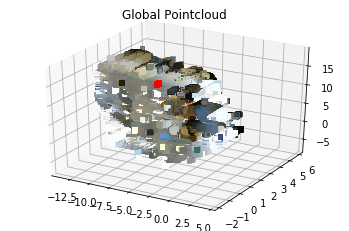

4579
highest %: 0.7836421
I am now at position [-8.94700813293457, 2.319162368774414, 2.7237308025360107]
Angle = [ 0. -3.  0.]
I can not find any red balls!
I am scanning the room....


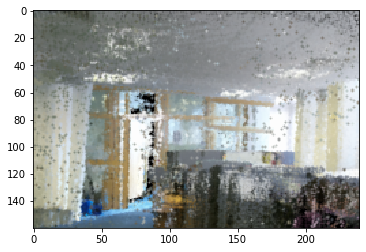

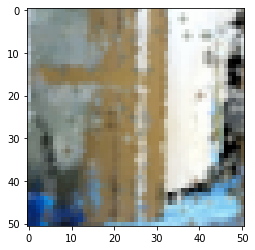

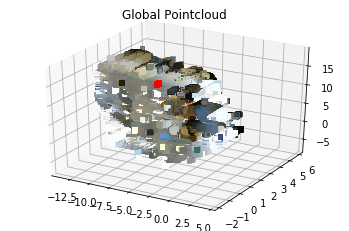

1058
highest %: 0.99341005
I am now at position [0.0, 0.0, 0.0]
Angle = [ 0. -4.  0.]
I can not find any red balls!
I am scanning the room....
I'm lost!


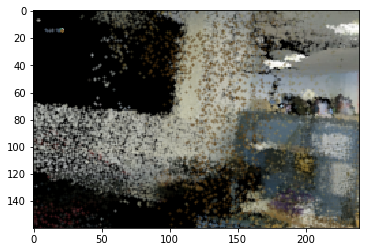

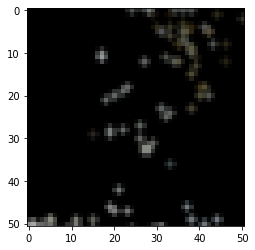

In [48]:
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])
previous_position = np.zeros([3])
failed = False
lost = 0

# Get current image from viewpoint
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

while not np.all(spheres_collected): # While there are spheres to find
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    PacMan.show_point_cloud(global_cloud)
    # Extract patches from the scene
    
    # Extracting Window Patches, X and Y center points
    patches, x_center, y_center = sliding_window()

    # Extract features from the patches
    
    # Predict the probability of a pixel being a sphere, based on the patch
    # Predicting probabilities on window patches
    patch_probabilities = model.predict_proba(patches)

    # Use probabilities to find sphere coordinates in 3D
    # Get highest probability window location
    image_position, highest_percent = highest_prob(patch_probabilities)

    # Plot image to check
    plt.figure()
    plt.imshow(image)
    plt.figure()
    plt.imshow(patches[image_position])
    

    # Update camera appropriately
    # New position
    #if failed == False:
    #position = [map1[x_center[image_position],y_center[image_position]],map2[x_center[image_position],y_center[image_position]],map3[x_center[image_position],y_center[image_position]]]

    position[0] = map1[x_center[image_position],y_center[image_position]]
    position[1] = map2[x_center[image_position],y_center[image_position]]
    position[2] = map3[x_center[image_position],y_center[image_position]]
        
    print('I am now at position [{0}, {1}, {2}]'.format(*position))
    print("Angle =", angle)
    
    try:
        global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
        print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
        lost = 0
        angle[1] = 0
        previous_position[0] = position[0]
        previous_position[1] = position[1]
        previous_position[2] = position[2]
        failed = False
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    except:
        print("I can not find any red balls!")
        print("I am scanning the room....")
        if failed != True:
            position[0] = previous_position[0]
            position[1] = previous_position[1]
            position[2] = previous_position[2]
        failed = True
        global_cloud, spheres_collected = PacMan.update_scene(previous_position, spheres_collected);
        
    if failed == True:
        #failed = False
        lost += 1
        angle[1] -= 1 #0.75
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, previous_position)
    #print("position: ", position)
    #print("previous postition:", previous_position)#position = preveous_position
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, preveous_position)

    if lost == 5:
        print("I'm lost!")
        break
        

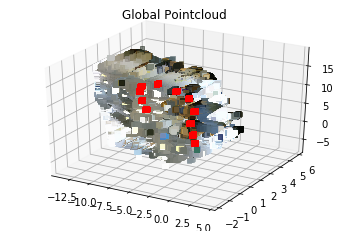

2885
highest %: 0.9999999
I am now at position [-0.1871206860642045, 0.0499370816520744, 2.309997371364827]
Angle = [0. 0. 0.]
I have found 1 out of 11 spheres!



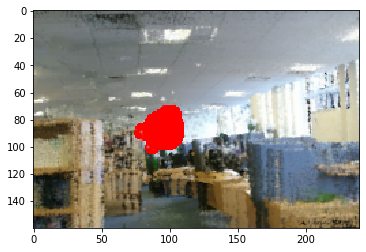

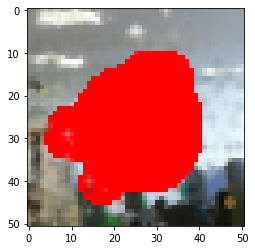

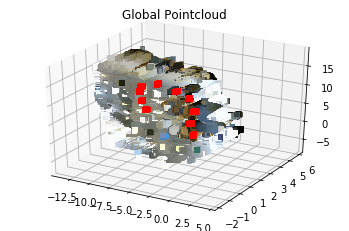

2223
highest %: 0.9999995
I am now at position [-0.32499977307039857, -0.030760641144832047, 4.673631407362985]
Angle = [0. 0. 0.]
I have found 2 out of 11 spheres!



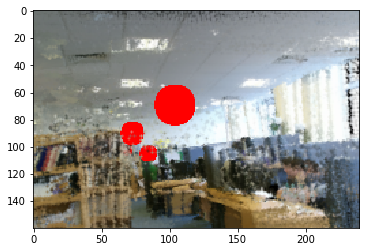

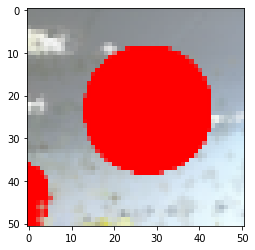

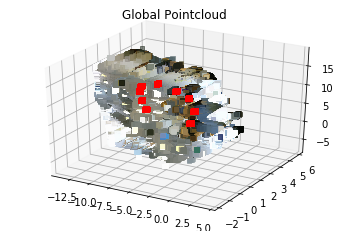

3999
highest %: 0.99999964
I am now at position [-0.9211396714313979, 0.19850687239066173, 7.011826953504689]
Angle = [0. 0. 0.]
I have found 3 out of 11 spheres!



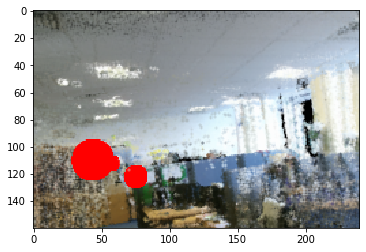

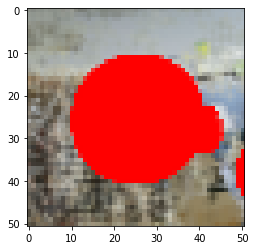

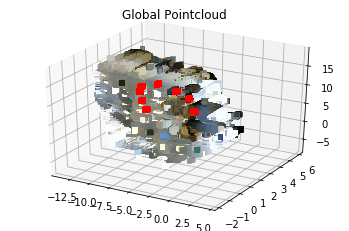

5170
highest %: 0.9999995
I am now at position [-1.0389913644214048, 0.6202065451988316, 9.378556972141258]
Angle = [0. 0. 0.]
I have found 4 out of 11 spheres!



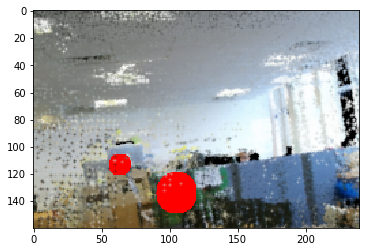

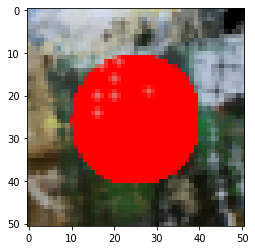

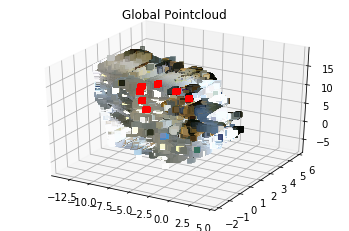

3421
highest %: 0.9999951
I am now at position [-1.892631140611772, 0.7702846017011646, 12.177158897733591]
Angle = [0. 0. 0.]
I have found 5 out of 11 spheres!



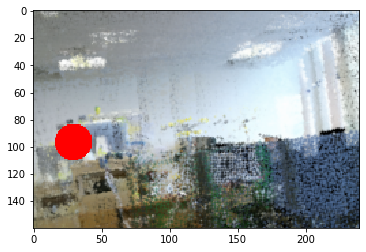

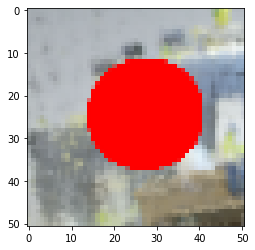

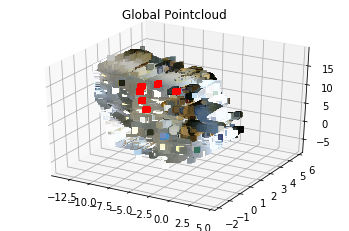

5201
highest %: 0.7777892
I am now at position [-1.302061676979065, 1.4700005054473877, 16.0594539642334]
Angle = [0. 0. 0.]
I can not find any red balls!
I am scanning the room....


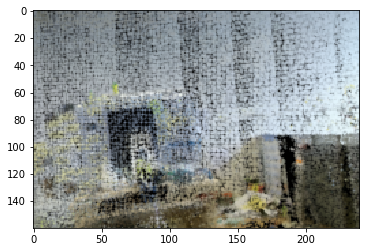

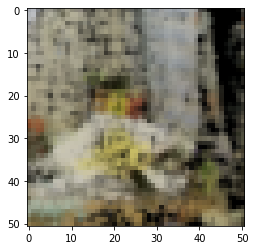

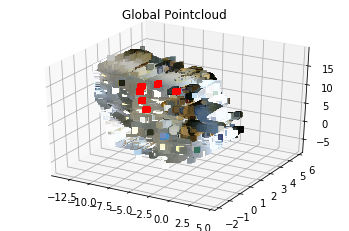

4275
highest %: 0.7419739
I am now at position [-7.619058609008789, 1.5027825832366943, 15.384218215942383]
Angle = [ 0.   -0.75  0.  ]
I can not find any red balls!
I am scanning the room....


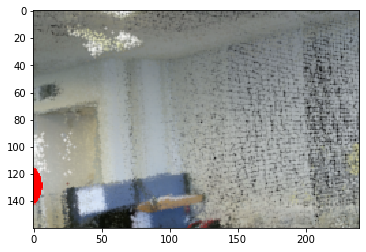

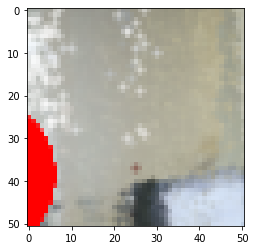

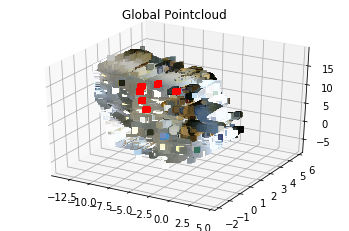

5034
highest %: 0.9999999
I am now at position [-3.7604275260935567, 1.0764115491097828, 12.914410448266665]
Angle = [ 0.  -1.5  0. ]
I have found 6 out of 11 spheres!



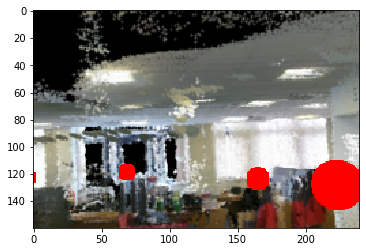

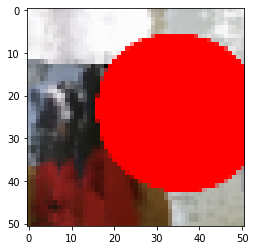

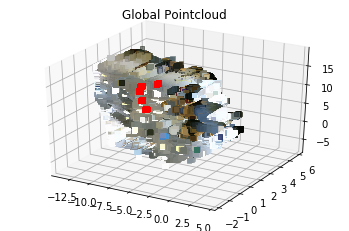

4613
highest %: 0.9999937
I am now at position [-6.55683074706226, 1.4556581843795708, 13.222707298767661]
Angle = [ 0.  -1.5  0. ]
I have found 7 out of 11 spheres!



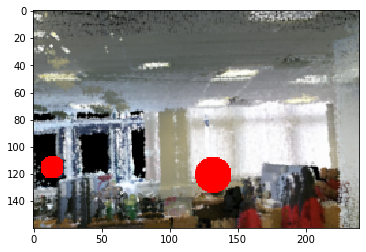

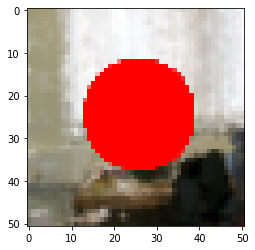

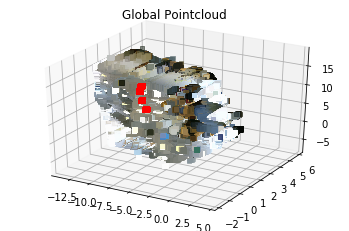

3425
highest %: 0.8850644
I am now at position [-12.892986297607422, 1.8261141777038574, 11.881464004516602]
Angle = [ 0.  -1.5  0. ]
I can not find any red balls!
I am scanning the room....


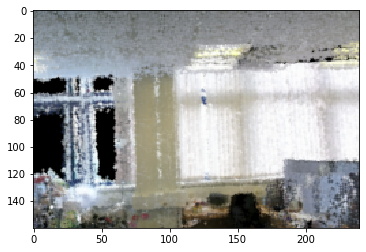

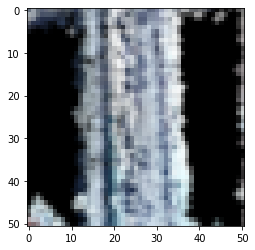

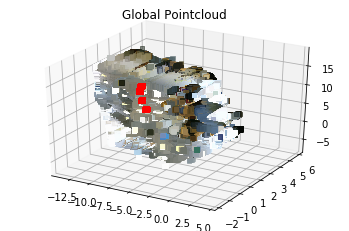

3665
highest %: 0.99998415
I am now at position [-8.899008161298088, 1.659840530579262, 11.532809472476941]
Angle = [ 0.   -2.25  0.  ]
I have found 8 out of 11 spheres!



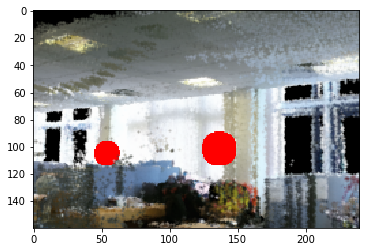

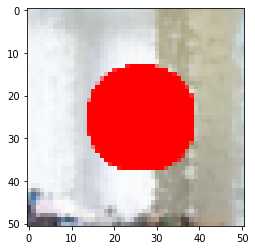

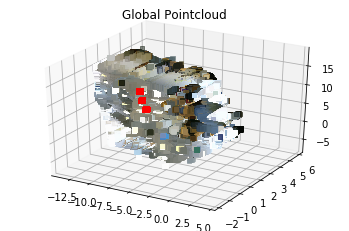

4749
highest %: 0.8851194
I am now at position [-12.942276954650879, 2.257528305053711, 9.921852111816406]
Angle = [ 0.   -2.25  0.  ]
I can not find any red balls!
I am scanning the room....


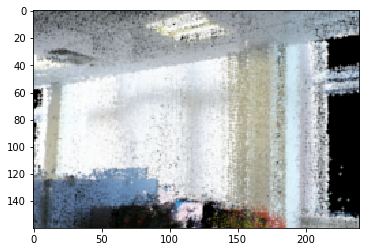

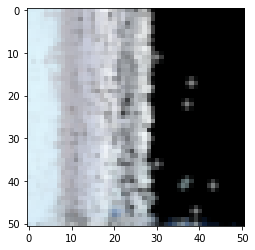

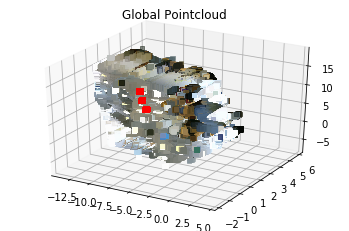

3769
highest %: 1.0
I am now at position [-9.36046794625407, 1.807337191771286, 9.769753281390143]
Angle = [ 0. -3.  0.]
I have found 9 out of 11 spheres!



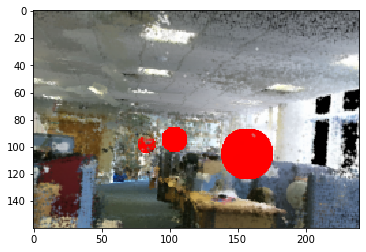

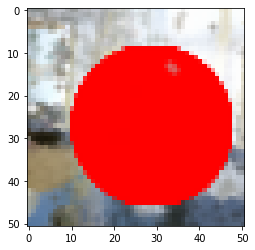

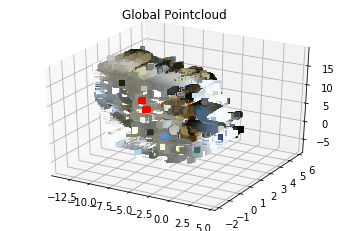

3060
highest %: 0.9999994
I am now at position [-9.272942077271956, 1.8690139943613548, 7.266256284485081]
Angle = [ 0. -3.  0.]
I have found 10 out of 11 spheres!



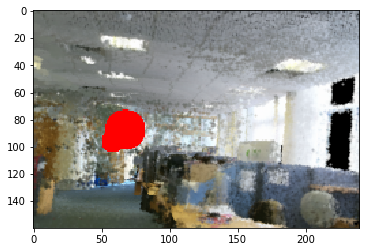

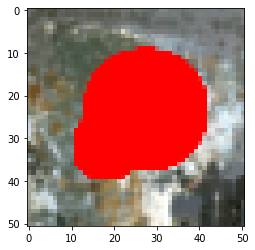

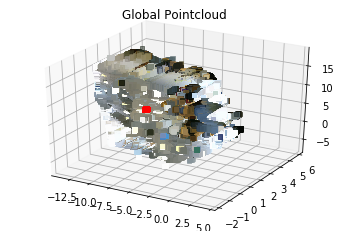

3717
highest %: 0.99999666
I am now at position [-9.039063177995292, 2.073354119836926, 4.556540106161687]
Angle = [ 0. -3.  0.]
I have found 11 out of 11 spheres!



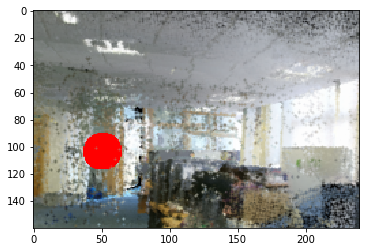

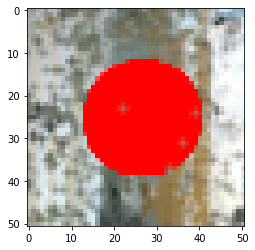

In [49]:
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])
previous_position = np.zeros([3])
failed = False
lost = 0

# Get current image from viewpoint
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

while not np.all(spheres_collected): # While there are spheres to find
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    PacMan.show_point_cloud(global_cloud)
    # Extract patches from the scene
    
    # Extracting Window Patches, X and Y center points
    patches, x_center, y_center = sliding_window()

    # Extract features from the patches
    
    # Predict the probability of a pixel being a sphere, based on the patch
    # Predicting probabilities on window patches
    patch_probabilities = model.predict_proba(patches)

    # Use probabilities to find sphere coordinates in 3D
    # Get highest probability window location
    image_position, highest_percent = highest_prob(patch_probabilities)

    # Plot image to check
    plt.figure()
    plt.imshow(image)
    plt.figure()
    plt.imshow(patches[image_position])
    

    # Update camera appropriately
    # New position
    #if failed == False:
    #position = [map1[x_center[image_position],y_center[image_position]],map2[x_center[image_position],y_center[image_position]],map3[x_center[image_position],y_center[image_position]]]

    position[0] = map1[x_center[image_position],y_center[image_position]]
    position[1] = map2[x_center[image_position],y_center[image_position]]
    position[2] = map3[x_center[image_position],y_center[image_position]]
        
    print('I am now at position [{0}, {1}, {2}]'.format(*position))
    print("Angle =", angle)
    
    try:
        global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
        print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
        lost = 0
        previous_position[0] = position[0]
        previous_position[1] = position[1]
        previous_position[2] = position[2]
        failed = False
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    except:
        print("I can not find any red balls!")
        print("I am scanning the room....")
        if failed != True:
            position[0] = previous_position[0]
            position[1] = previous_position[1]
            position[2] = previous_position[2]
        failed = True
        global_cloud, spheres_collected = PacMan.update_scene(previous_position, spheres_collected);
        
    if failed == True:
        #failed = False
        lost += 1
        angle[1] -= 0.75
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, previous_position)
    #print("position: ", position)
    #print("previous postition:", previous_position)#position = preveous_position
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, preveous_position)

    if lost == 5:
        print("I'm lost!")
        break
        

patch labels: [0 0 0 ... 0 0 0]
2885
highest %: 0.9999999
I am now at position [-0.1871206860642045, 0.0499370816520744, 2.309997371364827]
I have found 1 out of 11 spheres!



KeyboardInterrupt: 

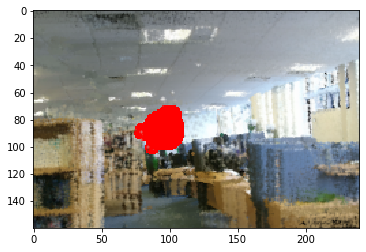

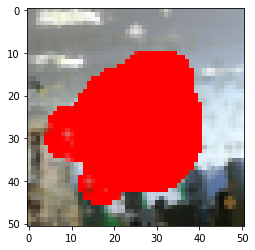

In [50]:
# Alternative method

global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])

# Get current image from viewpoint
#image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

while not np.all(spheres_collected): # While there are spheres to find
    image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    
    # Extract patches from the scene
    
    # Extracting Window Patches, X and Y center points
    patches, x_center, y_center = sliding_window()

    # Extract features from the patches
    
    # Predict the probability of a pixel being a sphere, based on the patch
    # Predicting probabilities on window patches
    patch_probabilities = model.predict_proba(patches)
    patch_labels = model.predict_classes(patches)
    
    print("patch labels:",patch_labels)
    # Use probabilities to find sphere coordinates in 3D
    # Get highest probability window location
    image_position, highest_percent = highest_prob(patch_probabilities)

    # Plot image to check
    plt.figure()
    plt.imshow(image)
    plt.figure()
    plt.imshow(patches[image_position])
    

    # Update camera appropriately
    # New position
    #position = [[map1[x_center[image_position],y_center[image_position]]],[map2[x_center[image_position],y_center[image_position]]],[map3[x_center[image_position],y_center[image_position]]]]
    #preveous_position = position
    if highest_percent > 0.94:
        position[0] = map1[x_center[image_position],y_center[image_position]]
        position[1] = map2[x_center[image_position],y_center[image_position]]
        position[2] = map3[x_center[image_position],y_center[image_position]]

        print('I am now at position [{0}, {1}, {2}]'.format(*position))
        global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
        print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
    else:
        angle[1] += 4.5

patch labels: [0 0 0 ... 0 0 0]
2885
highest %: 0.9999999
highest patch label: 0


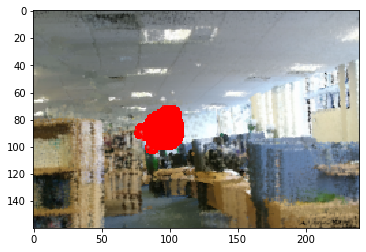

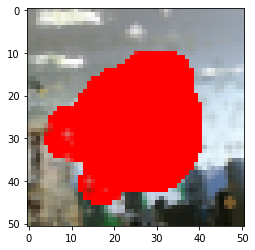

In [51]:
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])

image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

# Extract patches from the scene

# Extracting Window Patches, X and Y center points
patches, x_center, y_center = sliding_window()

# Extract features from the patches

# Predict the probability of a pixel being a sphere, based on the patch
# Predicting probabilities on window patches
patch_probabilities = model.predict_proba(patches)
patch_labels = model.predict_classes(patches)
np.unique(patch_labels)
print("patch labels:",patch_labels)

image_position, highest_percent = highest_prob(patch_probabilities)

print("highest patch label:",patch_labels[image_position])

# Plot image to check
plt.figure()
plt.imshow(image)
plt.figure()
plt.imshow(patches[image_position])

In [53]:
np.unique(patch_labels)

array([0])

In [24]:
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])

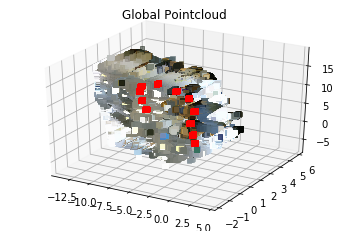

2885
highest %: 0.9999999
I am now at position [-0.1871206860642045, 0.0499370816520744, 2.309997371364827]
I have found 1 out of 11 spheres!



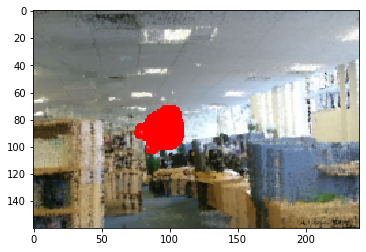

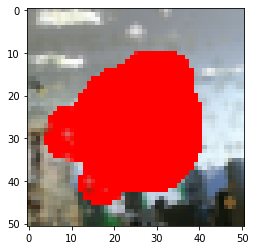

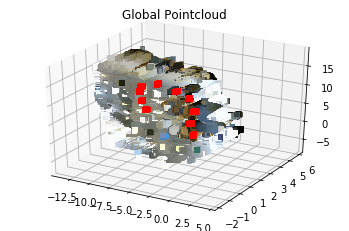

2223
highest %: 0.9999995
I am now at position [-0.32499977307039857, -0.030760641144832047, 4.673631407362985]
I have found 2 out of 11 spheres!



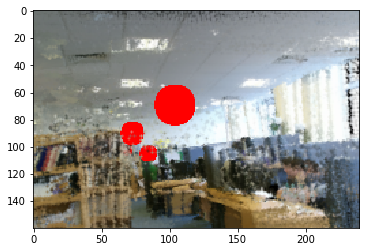

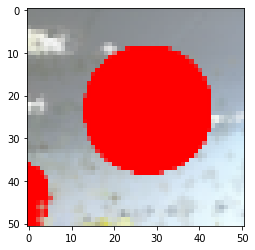

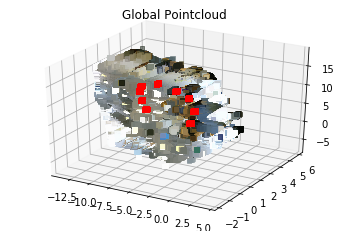

3999
highest %: 0.99999964
I am now at position [-0.9211396714313979, 0.19850687239066173, 7.011826953504689]
I have found 3 out of 11 spheres!



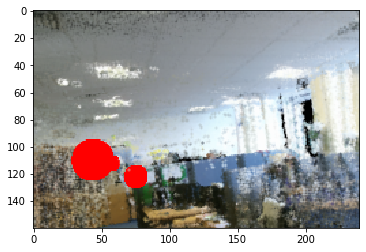

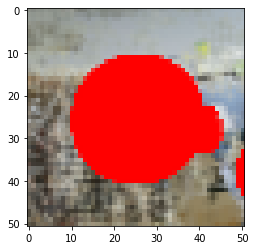

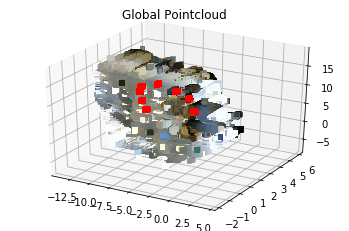

5170
highest %: 0.9999995
I am now at position [-1.0389913644214048, 0.6202065451988316, 9.378556972141258]
I have found 4 out of 11 spheres!



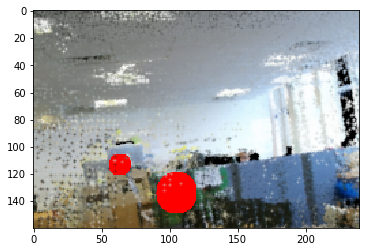

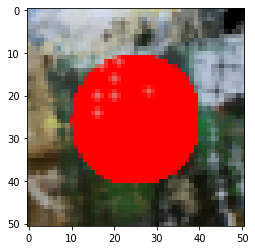

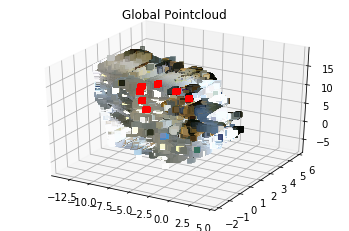

3421
highest %: 0.9999951
I am now at position [-1.892631140611772, 0.7702846017011646, 12.177158897733591]
I have found 5 out of 11 spheres!



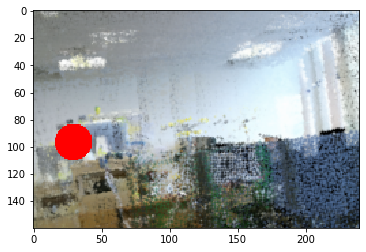

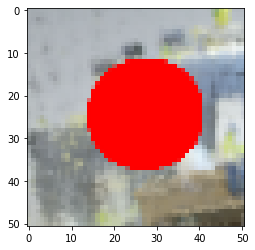

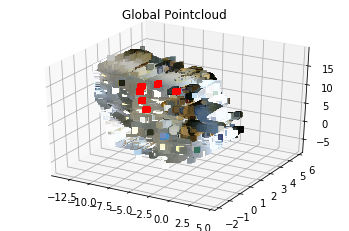

5201
highest %: 0.7777892
I am now at position [-1.302061676979065, 1.4700005054473877, 16.0594539642334]
I can not find any red balls!
I am scanning the room....


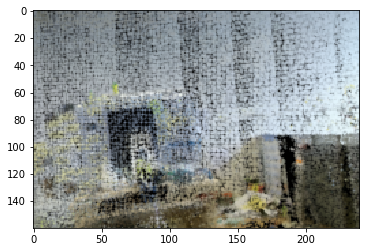

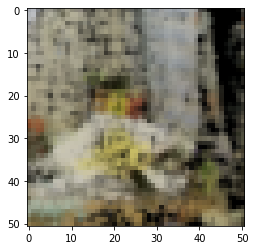

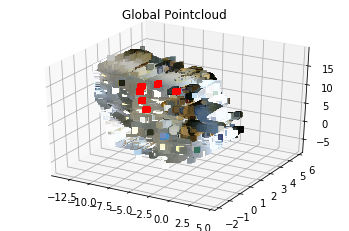

4275
highest %: 0.7419739
I am now at position [-7.619058609008789, 1.5027825832366943, 15.384218215942383]
I can not find any red balls!
I am scanning the room....


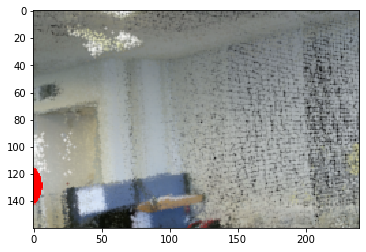

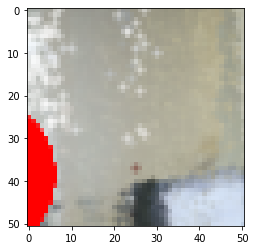

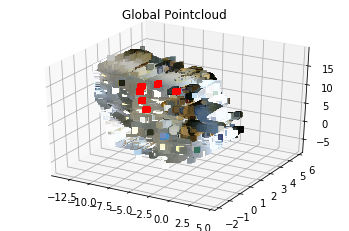

5034
highest %: 0.9999999
I am now at position [-3.7604275260935567, 1.0764115491097828, 12.914410448266665]
I have found 6 out of 11 spheres!



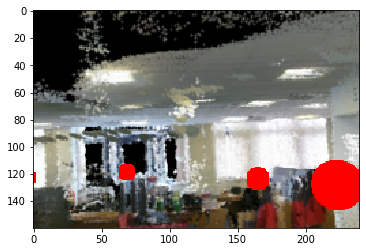

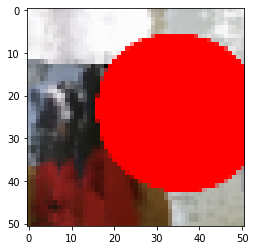

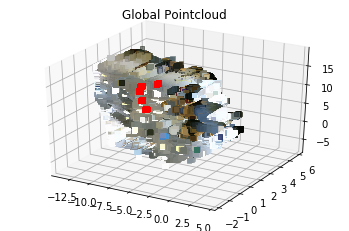

4613
highest %: 0.9999937
I am now at position [-6.55683074706226, 1.4556581843795708, 13.222707298767661]
I have found 7 out of 11 spheres!



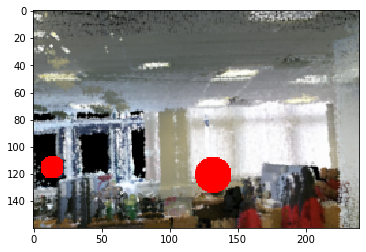

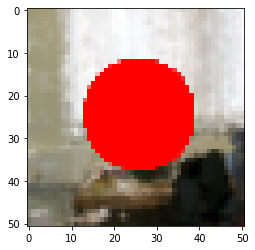

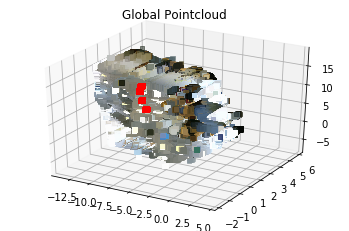

3425
highest %: 0.8850644
I am now at position [-12.892986297607422, 1.8261141777038574, 11.881464004516602]
I can not find any red balls!
I am scanning the room....


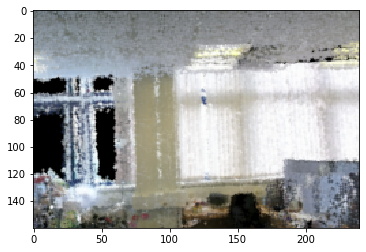

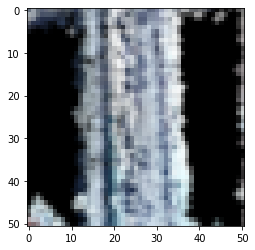

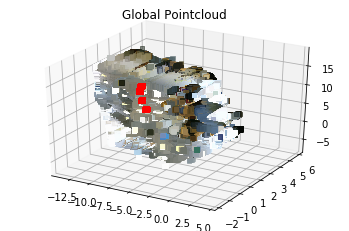

3665
highest %: 0.99998415
I am now at position [-8.899008161298088, 1.659840530579262, 11.532809472476941]
I have found 8 out of 11 spheres!



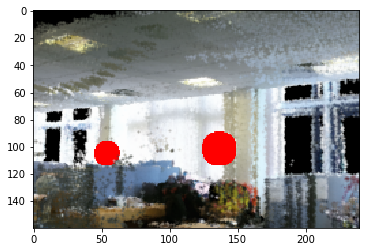

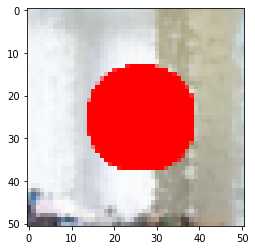

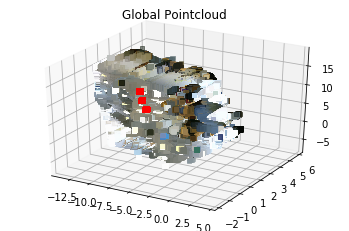

4749
highest %: 0.8851194
I am now at position [-12.942276954650879, 2.257528305053711, 9.921852111816406]
I can not find any red balls!
I am scanning the room....


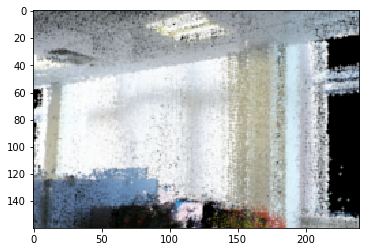

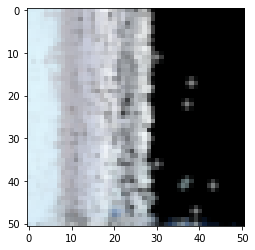

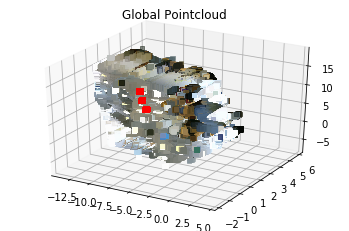

3769
highest %: 1.0
I am now at position [-9.36046794625407, 1.807337191771286, 9.769753281390143]
I have found 9 out of 11 spheres!



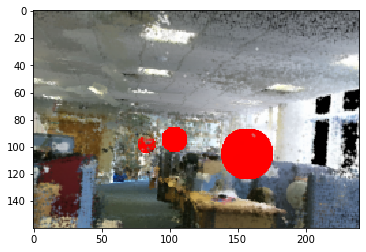

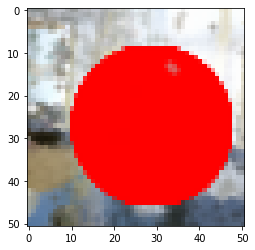

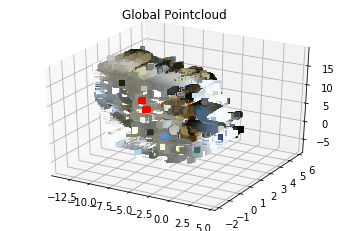

3060
highest %: 0.9999994
I am now at position [-9.272942077271956, 1.8690139943613548, 7.266256284485081]
I have found 10 out of 11 spheres!



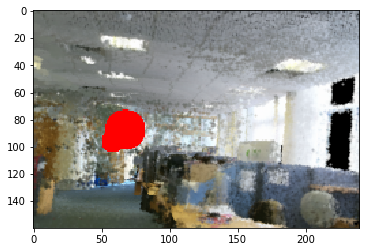

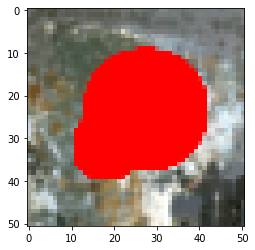

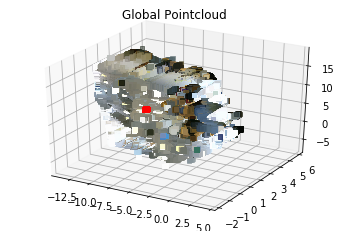

3717
highest %: 0.99999666
I am now at position [-9.039063177995292, 2.073354119836926, 4.556540106161687]
I have found 11 out of 11 spheres!



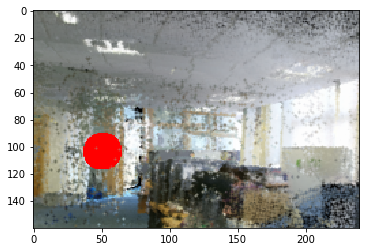

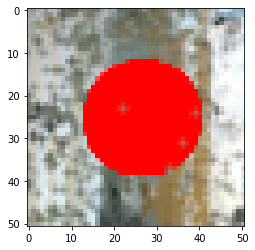

In [54]:
#2nd try
global_cloud, spheres_collected = PacMan.startup_scene()

position = np.zeros([3])
angle = np.zeros([3])
previous_position = np.zeros([3])
failed = False
lost = 0

# Get current image from viewpoint
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

while not np.all(spheres_collected): # While there are spheres to find
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    PacMan.show_point_cloud(global_cloud)
    # Extract patches from the scene
    
    # Extracting Window Patches, X and Y center points
    patches, x_center, y_center = sliding_window()

    # Extract features from the patches
    
    # Predict the probability of a pixel being a sphere, based on the patch
    # Predicting probabilities on window patches
    patch_probabilities = model.predict_proba(patches)

    # Use probabilities to find sphere coordinates in 3D
    # Get highest probability window location
    image_position, highest_percent = highest_prob(patch_probabilities)

    # Plot image to check
    plt.figure()
    plt.imshow(image)
    plt.figure()
    plt.imshow(patches[image_position])
    

    # Update camera appropriately
    # New position
    #if failed == False:
    #position = [map1[x_center[image_position],y_center[image_position]],map2[x_center[image_position],y_center[image_position]],map3[x_center[image_position],y_center[image_position]]]

    position[0] = map1[x_center[image_position],y_center[image_position]]
    position[1] = map2[x_center[image_position],y_center[image_position]]
    position[2] = map3[x_center[image_position],y_center[image_position]]
        
    print('I am now at position [{0}, {1}, {2}]'.format(*position))
    #print("Angle =", angle)
    
    try:
        global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
        print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
        lost = 0
        previous_position[0] = position[0]
        previous_position[1] = position[1]
        previous_position[2] = position[2]
        failed = False
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    except:
        print("I can not find any red balls!")
        print("I am scanning the room....")
        if failed != True:
            position[0] = previous_position[0]
            position[1] = previous_position[1]
            position[2] = previous_position[2]
        failed = True
        global_cloud, spheres_collected = PacMan.update_scene(previous_position, spheres_collected);
        
    if failed == True:
        #failed = False
        lost += 1
        angle[1] -= 0.75
        image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, previous_position)
    #print("position: ", position)
    #print("previous postition:", previous_position)#position = preveous_position
    #image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, preveous_position)

    if lost == 5:
        print("I'm lost!")
        break
        

In [23]:
#angle[1] =  0
print(angle)

[0. 4. 0.]


[0. 0. 0.]
[ 0. -1.  0.]
[ 0. -2.  0.]
[ 0. -3.  0.]
[ 0. -4.  0.]


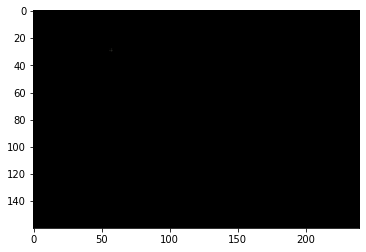

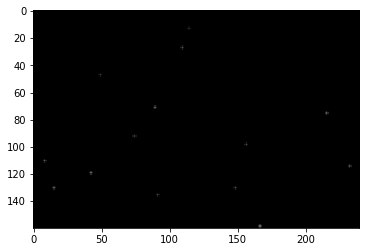

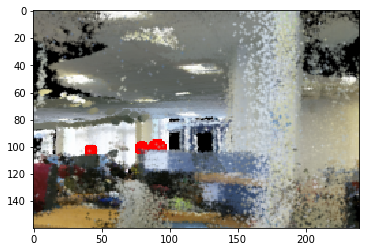

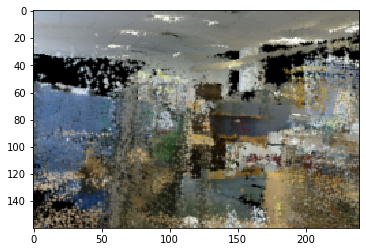

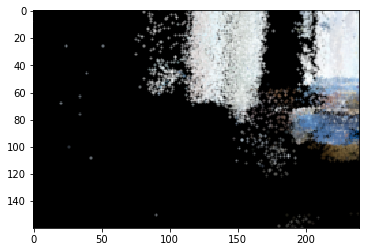

In [31]:
position[0] = -0.94
position[1] = 1.01
position[2] = 16.56


'''
position[0] = -1.88
position[1] = 0.77
position[2] = 12.17
'''
# -0.94857132  1.01753592 16.56329918

for i in range(5):
    angle[1] =  -i
    print(angle)
    image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    
    plt.figure()
    plt.imshow(image)



#global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
#print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));



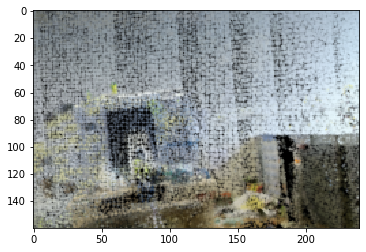

In [17]:
plt.imshow(image)

[0.  0.5 0. ]
[ 0.  -0.5  0. ]
[ 0.  -1.5  0. ]
[ 0.  -2.5  0. ]
[ 0.  -3.5  0. ]


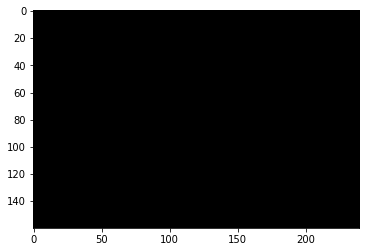

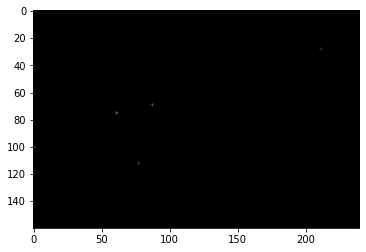

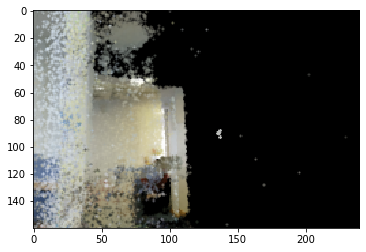

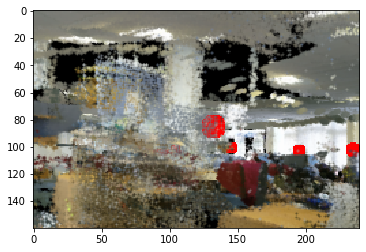

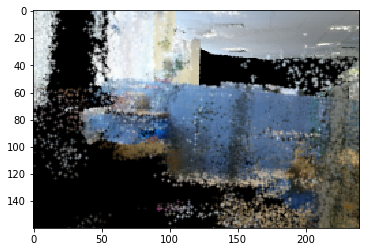

In [30]:
position[0] = -0.94
position[1] = 1.01
position[2] = 16.56

for i in range(0,5,1):
    angle[1] =  - (i-0.5)
    print(angle)
    image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
    
    plt.figure()
    plt.imshow(image)

In [ ]:
position[0] = -1.88
position[1] = 0.77
position[2] = 12.17

In [ ]:
angle[1] =  i
print(angle)
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)

plt.figure()
plt.imshow(image)

In [16]:
angle[1] =  3

In [ ]:
image, map1, map2, map3, map4 = PacMan.project_pointcloud_image(global_cloud, angle, position)
#7 -> 3.5 + 1
# Extract patches from the scene

# Extracting Window Patches, X and Y center points
patches, x_center, y_center = sliding_window()

# Extract features from the patches

# Predict the probability of a pixel being a sphere, based on the patch
# Predicting probabilities on window patches
patch_probabilities = model.predict_proba(patches)

# Use probabilities to find sphere coordinates in 3D
# Get highest probability window location
image_position = highest_prob(patch_probabilities)

# Plot image to check
plt.figure()
plt.imshow(patches[image_position])
plt.show()


In [ ]:
plt.imshow(image)

In [ ]:
plt.imshow(image)

In [ ]:
plt.imshow(image)

In [ ]:
position[0] = map1[x_center[image_position],y_center[image_position]]
position[1] = map2[x_center[image_position],y_center[image_position]]
position[2] = map3[x_center[image_position],y_center[image_position]]

print('I am now at position [{0}, {1}, {2}]'.format(*position))

try:
    
    global_cloud, spheres_collected = PacMan.update_scene(position, spheres_collected);
    print('I have found {0} out of {1} spheres!\n'.format(np.sum(spheres_collected), len(spheres_collected)));
except:
    print("I can not find any red balls!")
    print("I am scanning the room")
    angle[1] =  -0.5

In [ ]:
angle.shape